# Importing libraries

In [189]:
import numpy as np
import pandas as pd
import warnings
from sklearn.feature_selection import f_regression, SelectKBest
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import Ridge
from sklearn.model_selection import RandomizedSearchCV
import plotly_express as px
import eli5
from eli5.sklearn import PermutationImportance
import category_encoders as ce
from sklearn import metrics
from pdpbox.pdp import pdp_isolate, pdp_plot
from pdpbox.pdp import pdp_interact, pdp_interact_plot
import plotly.graph_objs as go
import pandas_profiling
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

# Data Exploration 

In [190]:
# importing and reading my dataset
df=pd.read_csv('https://raw.githubusercontent.com/VeraMendes/Project---Train-a-predictive-model/master/led.csv')
print(df.shape)
df.head()

(2938, 22)


,Country,Year,Status,Lifeexpectancy,AdultMortality,infantdeaths,Alcohol,percentageexpenditure,HepatitisB,Measles,...,Polio,Totalexpenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [191]:
# changing my column names
df = df.rename(columns = {
    'Country':'country','Year':'year', 'Status':'development','Lifeexpectancy':'lifespan',
    'AdultMortality':'adult_mortality', 'infantdeaths':'infant_deaths',
    'Alcohol':'alcohol_consumption', 'percentageexpenditure':'percentage_expenditure',
    'HepatitisB':'hepatitisb','Measles':'measles','BMI':'BMI','under-fivedeaths':'baby_deaths',
    'Polio':'polio', 'Totalexpenditure':'total_expenditure','Diphtheria':'diphtheria','HIV/AIDS':'HIV',
    'GDP':'GDP','Population':'population','thinness1-19years':'thinness_teenager',
    'thinness5-9years':'thinness_children','Incomecompositionofresources':'ICR','Schooling':'education'
})

df.head()

,country,year,development,lifespan,adult_mortality,infant_deaths,alcohol_consumption,percentage_expenditure,hepatitisb,measles,...,polio,total_expenditure,diphtheria,HIV,GDP,population,thinness_teenager,thinness_children,ICR,education
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [192]:
# dropping nan's for lifespan
df = df.dropna(axis=0, subset=['lifespan'])
# due to leakage problems, I am creating a new column which is going to be my y_target: next_year_lifespan
df['next_year_lifespan']= df['lifespan'].shift(1)
# 2015 does not have data on y_target for any country
# With pd.shift, I have moved into 2015 wrong values for the countries considered.
year_2015 = df[df.year == 2015]
# For my analysis I am dropping 2015 rows to avoid errors and leakage.
df = df[df.year != 2015]
# checking dataset and dimensions
print(df.shape)
df.head()

(2745, 23)


,country,year,development,lifespan,adult_mortality,infant_deaths,alcohol_consumption,percentage_expenditure,hepatitisb,measles,...,total_expenditure,diphtheria,HIV,GDP,population,thinness_teenager,thinness_children,ICR,education,next_year_lifespan
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,65.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,59.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,59.9
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,59.5
5,Afghanistan,2010,Developing,58.8,279.0,74,0.01,79.679367,66.0,1989,...,9.20,66.0,0.1,553.328940,2883167.0,18.4,18.4,0.448,9.2,59.2


In [6]:
# looking into nan's
df.isnull().sum()

country                     0
year                        0
development                 0
lifespan                    0
adult_mortality             0
infant_deaths               0
alcohol_consumption        16
percentage_expenditure      0
hepatitisb                544
measles                     0
BMI                        30
baby_deaths                 0
polio                      19
total_expenditure          45
diphtheria                 19
HIV                         0
GDP                       414
population                603
thinness_teenager          30
thinness_children          30
ICR                       150
education                 150
next_year_lifespan          0
dtype: int64

### Time Series

In [7]:
# using 2013 & 2014 as test
# using 2011 & 2012 as val
# I cannot use 2015 values as I don't have values for the next year lifespan (2016)

In [193]:
# splitting my data into a time series manner
train = df[df['year']<2011]
val = df[(df.year == 2011) | (df.year == 2012)]
test = df[(df.year == 2013) | (df.year == 2014)]
# checking dimensions
train.shape, val.shape, test.shape

((2013, 23), (366, 23), (366, 23))

### Pandas Profiling

In [11]:
# general view of my train dataset
pandas_profiling.ProfileReport(train)

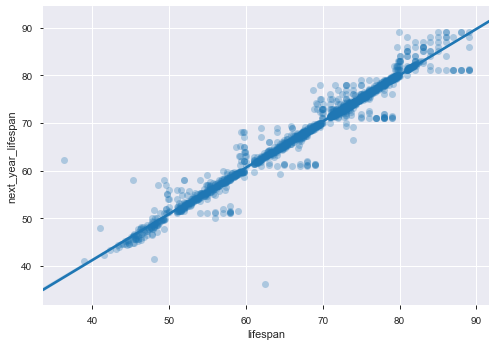

In [13]:
# relationship between previous and next year lifespan
sns.regplot(x=train['lifespan'],y=train['next_year_lifespan'], scatter_kws={'alpha':0.3});

Text(0.5, 1, 'Correlation Matrix')

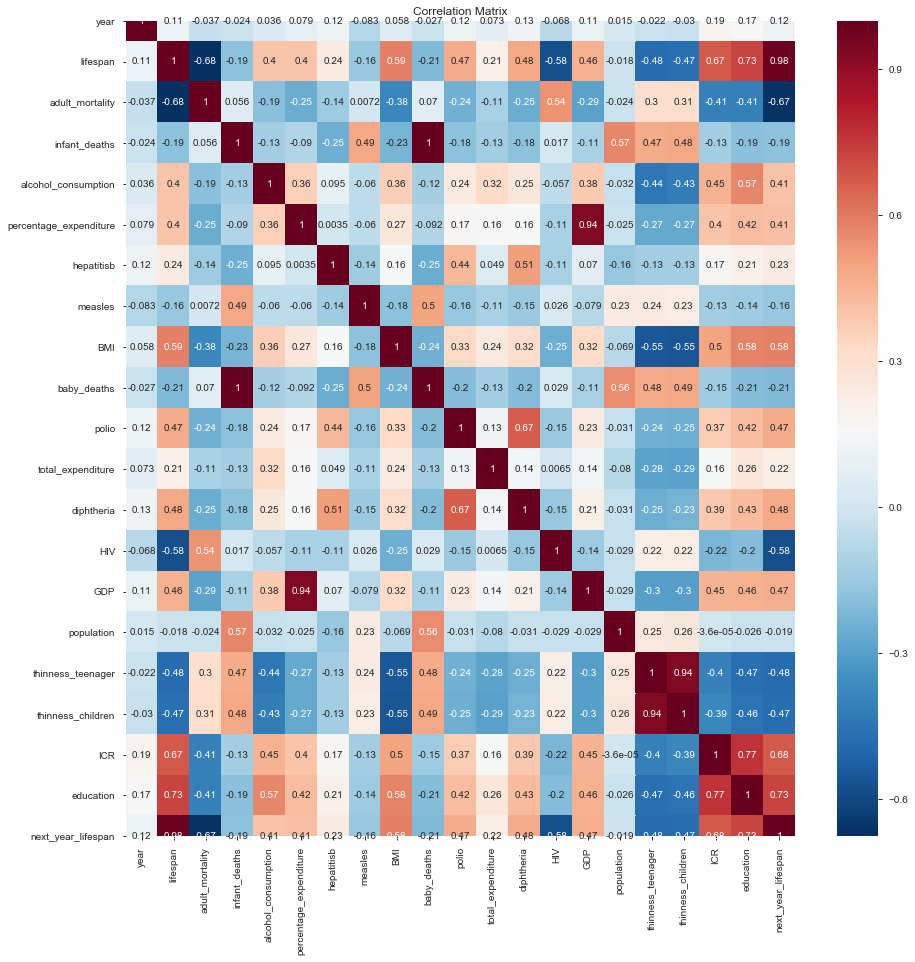

In [14]:
# correlation between features
corr_matrix = train.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_matrix, annot=True, cmap='RdBu_r')
plt.title('Correlation Matrix')

In [15]:
# looking into different features and how they correlate
px.scatter_matrix(train, dimensions=['lifespan', 'baby_deaths', 'infant_deaths', 'education'], color="development")

In [16]:
# lifespan correlations
px.scatter(train, x="lifespan", y="next_year_lifespan", color="year", trendline="ols", marginal_x="violin", marginal_y="box")

In [17]:
# adult mortality and GDP correlation
px.scatter(train, x="adult_mortality", y="GDP", color="next_year_lifespan", trendline="ols", marginal_x="violin", marginal_y="box")

In [18]:
# adult mortality and target in different countries development level
px.scatter(train, x="adult_mortality", y="next_year_lifespan", color="development", trendline="ols", marginal_x="violin", marginal_y="box")

In [19]:
# target through the years
px.violin(train, y="next_year_lifespan", x="year", box=True, points="all")

In [20]:
# looking into alcohol consumption
px.scatter(train,
          x="alcohol_consumption",
          y="next_year_lifespan",
          color='development',
          hover_name="country",
          animation_frame="year",
          animation_group="country",
          range_x=[0,18],
          range_y=[30,90])

In [21]:
# target over the years in countries with different development levels
px.violin(train, y="next_year_lifespan", x="development", color="year", box=True, points="all")

In [22]:
# looking into disease and immunization
px.scatter_matrix(train, dimensions=['next_year_lifespan', 'polio', 'measles', 'hepatitisb', 'diphtheria', 'HIV'], color="development")

# Analysis, Feature engineering and Modelling

In [194]:
# Arrange data into X features matrix and y target vector
target = 'next_year_lifespan'
baseline_values = 'lifespan'
cols_to_drop = ['next_year_lifespan']
X_train = train[train.columns.drop(cols_to_drop)]
y_train = train['next_year_lifespan']
X_val = val[val.columns.drop(cols_to_drop)]
y_val = val['next_year_lifespan']
X_test = test[test.columns.drop(cols_to_drop)]
y_test = test['next_year_lifespan']

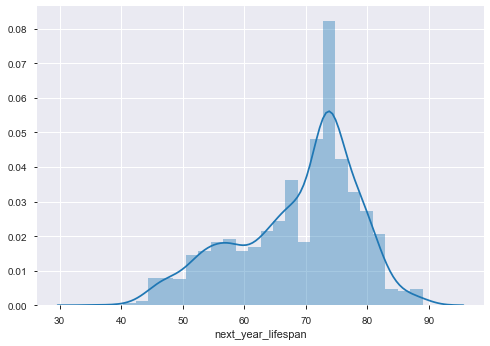

In [24]:
# target distribution on train set
sns.distplot(y_train);

## Baseline

In [195]:
# using previous year lifespan, as y_pred = y_baseline
y_baseline = pd.Series(train['lifespan'], index=train.index)
# using previous year lifespan, as y_pred = y_baseline to try to find a better model fit
mean_baseline = train['next_year_lifespan'].mean()
y_pred_bl = val['lifespan']
val_mae = mean_absolute_error(y_val, y_pred_bl)
val_rmse = np.sqrt(mean_squared_error(y_val, y_pred_bl))
val_r2 = r2_score(y_val, y_pred_bl)
print('mean baseline:', train['next_year_lifespan'].mean())
print(f'Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): {val_mae:.4f}')
print('Validation Root_Mean_Square_error of baseline:', val_rmse)
print('Validation R\u00b2 of baseline:', val_r2)

mean baseline: 68.68564331843021
Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): 0.8281
Validation Root_Mean_Square_error of baseline: 1.751821846370448
Validation R² of baseline: 0.9571880154620618


In [196]:
# using transformers to apply on different models
transformers = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
)

X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)
X_test_transformed = transformers.transform(X_test)

## Ridge

In [197]:
ri = Ridge()
ri.fit(X_train_transformed, y_train)
y_pred_ri = ri.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_ri = mean_absolute_error(y_val, y_pred_ri)
val_rmse_ri = np.sqrt(mean_squared_error(y_val, y_pred_ri))
val_r2_ri = r2_score(y_val, y_pred_ri)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_ri:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_ri)
print('Validation R\u00b2:', val_r2_ri)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 0.8264
Validation Root_Mean_Square_error: 1.681475739934421
Validation R²: 0.9605572946315315


## Decision Tree Regressor

In [198]:
dtr = DecisionTreeRegressor()
dtr.fit(X_train_transformed, y_train)
y_pred_dtr = dtr.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_dtr = mean_absolute_error(y_val, y_pred_dtr)
val_rmse_dtr = np.sqrt(mean_squared_error(y_val, y_pred_dtr))
val_r2_dtr = r2_score(y_val, y_pred_dtr)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_dtr:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_dtr)
print('Validation R\u00b2:', val_r2_dtr)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 1.2615
Validation Root_Mean_Square_error: 2.7073720446178324
Validation R²: 0.8977457507683665


## Random Forest Regressor

In [199]:
rf = RandomForestRegressor(n_estimators=100, n_jobs=-1)
rf.fit(X_train_transformed, y_train)
y_pred_rf = rf.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_rf = mean_absolute_error(y_val, y_pred_rf)
val_rmse_rf = np.sqrt(mean_squared_error(y_val, y_pred_rf))
val_r2_rf = r2_score(y_val, y_pred_rf)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_rf:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_rf)
print('Validation R\u00b2:', val_r2_rf)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 0.9315
Validation Root_Mean_Square_error: 1.8465555388136803
Validation R²: 0.9524325102960519


### Feature Permutation for model RandomForest

In [200]:
# using feature permutation on my model RF
permuter = PermutationImportance(
    rf, 
    scoring='neg_mean_absolute_error', 
    n_iter=5, 
    random_state=42
)

permuter.fit(X_val_transformed, y_val)

PermutationImportance(cv='prefit',
                      estimator=RandomForestRegressor(bootstrap=True,
                                                      criterion='mse',
                                                      max_depth=None,
                                                      max_features='auto',
                                                      max_leaf_nodes=None,
                                                      min_impurity_decrease=0.0,
                                                      min_impurity_split=None,
                                                      min_samples_leaf=1,
                                                      min_samples_split=2,
                                                      min_weight_fraction_leaf=0.0,
                                                      n_estimators=100,
                                                      n_jobs=-1,
                                                      oob_score=False,
   

In [35]:
feature_names = X_val.columns.tolist()
pd.Series(permuter.feature_importances_, feature_names).sort_values(ascending=False)

lifespan                  8.555310e+00
adult_mortality           2.506044e-01
BMI                       1.455257e-01
ICR                       7.924590e-02
education                 4.093224e-02
alcohol_consumption       2.854208e-02
HIV                       1.361585e-02
thinness_teenager         1.032842e-02
country                   7.898907e-03
thinness_children         7.624044e-03
percentage_expenditure    4.861749e-03
diphtheria                3.021858e-03
population                1.061749e-03
baby_deaths               3.278689e-05
year                     -1.554312e-16
development              -3.934426e-05
total_expenditure        -1.166120e-03
infant_deaths            -1.638798e-03
measles                  -1.930055e-03
polio                    -2.747541e-03
GDP                      -8.747541e-03
hepatitisb               -1.471257e-02
dtype: float64

In [37]:
# looking into feature importance and weight
eli5.show_weights(
    permuter, 
    top=None,
    feature_names = feature_names
)

Weight,Feature
8.5553 ± 0.3468,lifespan
0.2506 ± 0.0934,adult_mortality
0.1455 ± 0.0947,BMI
0.0792 ± 0.0160,ICR
0.0409 ± 0.0113,education
0.0285 ± 0.0145,alcohol_consumption
0.0136 ± 0.0083,HIV
0.0103 ± 0.0058,thinness_teenager
0.0079 ± 0.0147,country
0.0076 ± 0.0074,thinness_children


## XGBoost Regressor

In [201]:
xgb = XGBRegressor(n_estimators=100, n_jobs=-1)
xgb.fit(X_train_transformed, y_train)
y_pred_xgb = xgb.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_xgb = mean_absolute_error(y_val, y_pred_xgb)
val_rmse_xgb = np.sqrt(mean_squared_error(y_val, y_pred_xgb))
val_r2_xgb = r2_score(y_val, y_pred_xgb)
print(f'Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): {val_mae_xgb:.4f}')
print('Validation Root_Mean_Square_error of baseline:', val_rmse_xgb)
print('Validation R\u00b2 of baseline:', val_r2_xgb)

[23:15:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): 0.8472
Validation Root_Mean_Square_error of baseline: 1.5160610741575995
Validation R² of baseline: 0.9679359130064651


In [202]:
xgbtuned = XGBRegressor(n_estimators=2000,max_depth=7, learning_rate=0.1, n_jobs=-1,
                       objective='reg:linear')
xgbtuned.fit(X_train_transformed, y_train)
y_pred_xgbtuned = xgbtuned.predict(X_val_transformed)

# MAE, RMSE & R2:
val_mae_xgbtuned = mean_absolute_error(y_val, y_pred_xgbtuned)
val_rmse_xgbtuned = np.sqrt(mean_squared_error(y_val, y_pred_xgbtuned))
val_r2_xgbtuned = r2_score(y_val, y_pred_xgbtuned)
print(f'Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): {val_mae_xgbtuned:.4f}')
print('Validation Root_Mean_Square_error of baseline:', val_rmse_xgbtuned)
print('Validation R\u00b2 of baseline:', val_r2_xgbtuned)

[23:15:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): 0.9514
Validation Root_Mean_Square_error of baseline: 1.701713705515852
Validation R² of baseline: 0.959602129073082


In [161]:
# with early stop
eval_set = [(X_train_transformed, y_train), 
            (X_val_transformed, y_val)]

xgbtuned_e = XGBRegressor(n_estimators=2000,max_depth=7, learning_rate=0.1, n_jobs=-1,
                       objective='reg:linear')

search = xgbtuned_e.fit(X_train_transformed, y_train, eval_set=eval_set, 
          eval_metric='mae', early_stopping_rounds=50)

search

[19:23:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-mae:61.3858	validation_1-mae:63.5643
Multiple eval metrics have been passed: 'validation_1-mae' will be used for early stopping.

Will train until validation_1-mae hasn't improved in 50 rounds.
[1]	validation_0-mae:55.2643	validation_1-mae:57.2612
[2]	validation_0-mae:49.7509	validation_1-mae:51.5824
[3]	validation_0-mae:44.7878	validation_1-mae:46.4589
[4]	validation_0-mae:40.3215	validation_1-mae:41.8691
[5]	validation_0-mae:36.2987	validation_1-mae:37.7365
[6]	validation_0-mae:32.6789	validation_1-mae:34.0124
[7]	validation_0-mae:29.4205	validation_1-mae:30.6269
[8]	validation_0-mae:26.4894	validation_1-mae:27.5781
[9]	validation_0-mae:23.8494	validation_1-mae:24.8448
[10]	validation_0-mae:21.4737	validation_1-mae:22.4017
[11]	validation_0-mae:19.3347	validation_1-mae:20.1697
[12]	validation_0-mae:17.4099	validation_1-mae:18.1602
[13]	validation_0-mae:

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=7, min_child_weight=1, missing=None, n_estimators=2000,
             n_jobs=-1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

### PDP feature dependence for adult_mortality and HIV with XGBoostRegressor

In [47]:
pipeline = make_pipeline(
ce.OrdinalEncoder(),
XGBRegressor(learning_rate=0.1,
             max_depth=7, n_estimators=2000,
             n_jobs=-1, objective='reg:linear')
)

pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_val)

[16:57:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


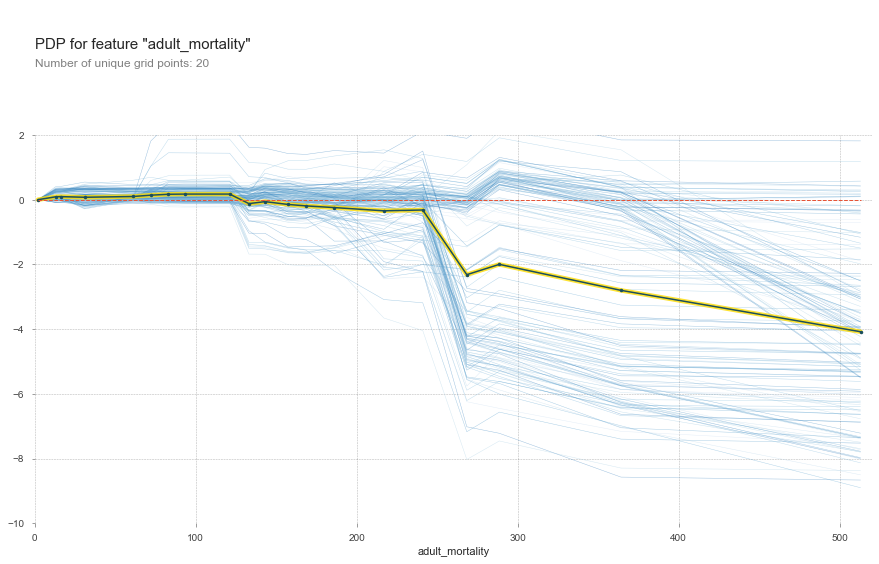

In [50]:
feature = 'adult_mortality'

isolated = pdp_isolate(
    model=pipeline, 
    dataset=X_val, 
    model_features=X_val.columns,
    feature=feature, 
    num_grid_points=20
)
pdp_plot(isolated, feature_name=feature, plot_lines=True, frac_to_plot=150) # Confusing parameter name
plt.xlim(0,520)
plt.ylim(-10,2);

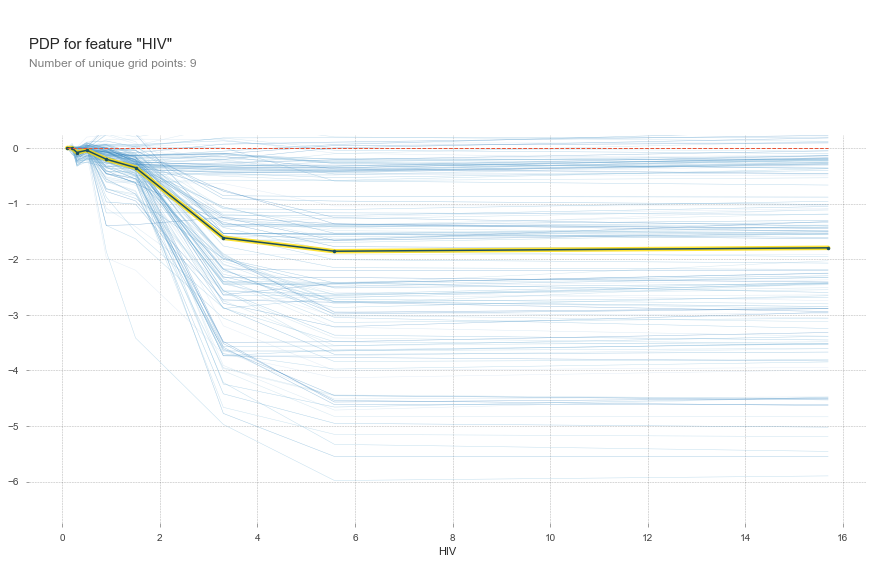

In [52]:
feature = 'HIV'

isolated = pdp_isolate(
    model=pipeline, 
    dataset=X_val, 
    model_features=X_val.columns,
    feature=feature, 
    num_grid_points=20
)
pdp_plot(isolated, feature_name=feature, plot_lines=True, frac_to_plot=150);

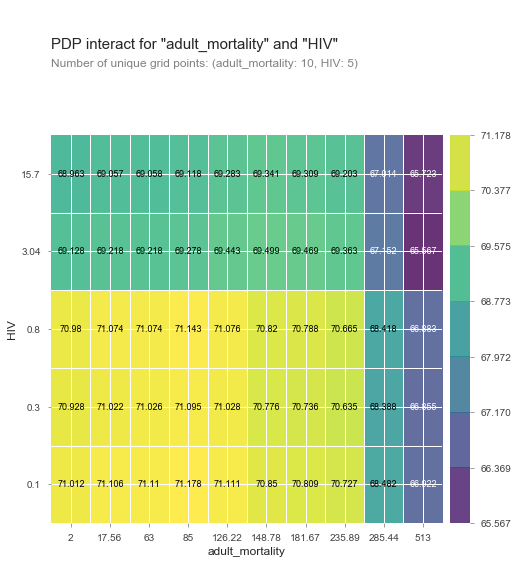

In [53]:
features = ['adult_mortality', 'HIV']

interactive = pdp_interact(
model=pipeline,
dataset=X_val,
model_features = X_val.columns,
features = features
)

pdp_interact_plot(interactive, plot_type='grid', feature_names=features);

## Linear Regression

In [203]:
lr = LinearRegression()
lr.fit(X_train_transformed, y_train)
y_pred_lr = lr.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_lr = mean_absolute_error(y_val, y_pred_lr)
val_rmse_lr = np.sqrt(mean_squared_error(y_val, y_pred_lr))
val_r2_lr = r2_score(y_val, y_pred_lr)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_lr:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_lr)
print('Validation R\u00b2:', val_r2_lr)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 0.8264
Validation Root_Mean_Square_error: 1.6814302126509693
Validation R²: 0.9605594304874043


In [70]:
# using feature permutation on my model LR
permuter = PermutationImportance(
    lr, 
    scoring='neg_mean_absolute_error', 
    n_iter=5, 
    random_state=42
)

permuter.fit(X_val_transformed, y_val)

PermutationImportance(cv='prefit',
                      estimator=LinearRegression(copy_X=True,
                                                 fit_intercept=True,
                                                 n_jobs=None, normalize=False),
                      n_iter=5, random_state=42, refit=True,
                      scoring='neg_mean_absolute_error')

In [71]:
feature_names = X_val.columns.tolist()
pd.Series(permuter.feature_importances_, feature_names).sort_values(ascending=False)

lifespan                  8.029416
baby_deaths               0.161055
infant_deaths             0.132750
education                 0.039954
HIV                       0.020137
adult_mortality           0.016522
polio                     0.013247
percentage_expenditure    0.012566
ICR                       0.007078
development               0.006720
total_expenditure         0.004848
diphtheria                0.003757
thinness_teenager         0.003579
thinness_children         0.002667
alcohol_consumption       0.001677
GDP                       0.001452
hepatitisb                0.000750
country                   0.000467
population                0.000021
measles                  -0.000010
year                     -0.000039
BMI                      -0.001309
dtype: float64

In [72]:
# looking into feature importance and weight
eli5.show_weights(
    permuter, 
    top=None,
    feature_names = feature_names
)

Weight,Feature
8.0294 ± 0.3768,lifespan
0.1611 ± 0.0188,baby_deaths
0.1327 ± 0.0268,infant_deaths
0.0400 ± 0.0175,education
0.0201 ± 0.0119,HIV
0.0165 ± 0.0065,adult_mortality
0.0132 ± 0.0142,polio
0.0126 ± 0.0227,percentage_expenditure
0.0071 ± 0.0048,ICR
0.0067 ± 0.0047,development


### selectkbest feature choice

In [204]:
# trying selectKbest for feature choice 
selector = SelectKBest(score_func=f_regression, k=5)
X_train_selected = selector.fit_transform(X_train_transformed, y_train)
X_val_selected = selector.transform(X_val_transformed)
X_train_selected.shape, X_val_selected.shape

((2013, 5), (366, 5))

In [205]:
# features selected by selectkbest
all_features = X_train.columns
selected_mask = selector.get_support()
selected_features = all_features[selected_mask]

print('Features selected:')
for feature in selected_features:
    print(feature)

Features selected:
lifespan
adult_mortality
BMI
ICR
education


In [206]:
# using Linear Regression
for k in range(1, len(X_train.columns)+1):
    print(f'{k} features')
    
    selector = SelectKBest(score_func=f_regression, k=k)
    X_train_selected = selector.fit_transform(X_train_transformed, y_train)
    X_val_selected = selector.transform(X_val_transformed)
    
    model1 = LinearRegression()
    model1.fit(X_train_selected, y_train)
    
    y_pred_model1 = model1.predict(X_val_selected)
    val_mae_m1 = mean_absolute_error(y_val, y_pred_model1)
    val_rmse_m1 = np.sqrt(mean_squared_error(y_val, y_pred_model1))
    val_r2_m1 = r2_score(y_val, y_pred_model1)
    print(f'Mean Absolut Error: {val_mae_m1:.4f}')
    print(f'Validation Root_Mean_Square_error: {val_rmse_m1:.4f}')
    print(f'Validation R\u00b2: {val_r2_m1:.4f}')

1 features
Mean Absolut Error: 0.7139
Validation Root_Mean_Square_error: 1.6827
Validation R²: 0.9605
2 features
Mean Absolut Error: 0.7197
Validation Root_Mean_Square_error: 1.6739
Validation R²: 0.9609
3 features
Mean Absolut Error: 0.7271
Validation Root_Mean_Square_error: 1.6675
Validation R²: 0.9612
4 features
Mean Absolut Error: 0.7273
Validation Root_Mean_Square_error: 1.6674
Validation R²: 0.9612
5 features
Mean Absolut Error: 0.7328
Validation Root_Mean_Square_error: 1.6693
Validation R²: 0.9611
6 features
Mean Absolut Error: 0.7690
Validation Root_Mean_Square_error: 1.6690
Validation R²: 0.9611
7 features
Mean Absolut Error: 0.7720
Validation Root_Mean_Square_error: 1.6693
Validation R²: 0.9611
8 features
Mean Absolut Error: 0.7744
Validation Root_Mean_Square_error: 1.6656
Validation R²: 0.9613
9 features
Mean Absolut Error: 0.7763
Validation Root_Mean_Square_error: 1.6579
Validation R²: 0.9617
10 features
Mean Absolut Error: 0.7824
Validation Root_Mean_Square_error: 1.6498
V

In [207]:
# choosing different X features matrix & defining my y target vector
target = 'next_year_lifespan'
cols_to_drop = ['country', 'year', 'development',
       'infant_deaths', 'alcohol_consumption', 'percentage_expenditure',
       'hepatitisb', 'measles', 'BMI', 'baby_deaths', 'polio',
       'total_expenditure', 'diphtheria', 'GDP', 'population',
       'thinness_teenager', 'thinness_children', 'education',
       'next_year_lifespan']
X_train = train[train.columns.drop(cols_to_drop)]
y_train = train['next_year_lifespan']
X_val = val[val.columns.drop(cols_to_drop)]
y_val = val['next_year_lifespan']
X_test = test[test.columns.drop(cols_to_drop)]
y_test = test['next_year_lifespan']

In [208]:
# using only 4 features as per the top ones on selectkbest
X_train.columns

Index(['lifespan', 'adult_mortality', 'HIV', 'ICR'], dtype='object')

In [209]:
# using transformers to apply on different models
transformers = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
)

X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)
X_test_transformed = transformers.transform(X_test)

## Ridge

In [210]:
ri2 = Ridge()
ri2.fit(X_train_transformed, y_train)
y_pred_ri2 = ri2.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_ri2 = mean_absolute_error(y_val, y_pred_ri2)
val_rmse_ri2 = np.sqrt(mean_squared_error(y_val, y_pred_ri2))
val_r2_ri2 = r2_score(y_val, y_pred_ri2)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_ri2:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_ri2)
print('Validation R\u00b2:', val_r2_ri2)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 0.7460
Validation Root_Mean_Square_error: 1.6714921037911985
Validation R²: 0.9610242803693079


## Decision Tree Regressor

In [211]:
dtr2 = DecisionTreeRegressor()
dtr2.fit(X_train_transformed, y_train)
y_pred_dtr2 = dtr2.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_dtr2 = mean_absolute_error(y_val, y_pred_dtr2)
val_rmse_dtr2 = np.sqrt(mean_squared_error(y_val, y_pred_dtr2))
val_r2_dtr2 = r2_score(y_val, y_pred_dtr2)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_dtr2:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_dtr2)
print('Validation R\u00b2:', val_r2_dtr2)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 1.1276
Validation Root_Mean_Square_error: 2.439032550299558
Validation R²: 0.9170109722895918


## Random Forest Regressor

In [212]:
rf2 = RandomForestRegressor(n_estimators=100, n_jobs=-1)
rf2.fit(X_train_transformed, y_train)
y_pred_rf2 = rf2.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_rf2 = mean_absolute_error(y_val, y_pred_rf2)
val_rmse_rf2 = np.sqrt(mean_squared_error(y_val, y_pred_rf2))
val_r2_rf2 = r2_score(y_val, y_pred_rf2)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_rf2:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_rf2)
print('Validation R\u00b2:', val_r2_rf2)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 0.8206
Validation Root_Mean_Square_error: 1.5583284496499619
Validation R²: 0.9661231139872869


## XGBoost Regressor

In [213]:
xgb2 = XGBRegressor(n_estimators=100, n_jobs=-1)
xgb2.fit(X_train_transformed, y_train)
y_pred_xgb2 = xgb2.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_xgb2 = mean_absolute_error(y_val, y_pred_xgb2)
val_rmse_xgb2 = np.sqrt(mean_squared_error(y_val, y_pred_xgb2))
val_r2_xgb2 = r2_score(y_val, y_pred_xgb2)
print(f'Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): {val_mae_xgb2:.4f}')
print('Validation Root_Mean_Square_error of baseline:', val_rmse_xgb2)
print('Validation R\u00b2 of baseline:', val_r2_xgb2)

[23:16:29] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): 0.7840
Validation Root_Mean_Square_error of baseline: 1.4513315608023358
Validation R² of baseline: 0.9706154690221755


In [214]:
xgbtuned2 = XGBRegressor(n_estimators=2000,max_depth=7, learning_rate=0.1, n_jobs=-1,
                       objective='reg:linear')
xgbtuned2.fit(X_train_transformed, y_train)
y_pred_xgbtuned2 = xgbtuned2.predict(X_val_transformed)

# MAE, RMSE & R2:
val_mae_xgbtuned2 = mean_absolute_error(y_val, y_pred_xgbtuned2)
val_rmse_xgbtuned2 = np.sqrt(mean_squared_error(y_val, y_pred_xgbtuned2))
val_r2_xgbtuned2 = r2_score(y_val, y_pred_xgbtuned2)
print(f'Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): {val_mae_xgbtuned2:.4f}')
print('Validation Root_Mean_Square_error of baseline:', val_rmse_xgbtuned2)
print('Validation R\u00b2 of baseline:', val_r2_xgbtuned2)

[23:16:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): 0.8931
Validation Root_Mean_Square_error of baseline: 1.6314002701503072
Validation R² of baseline: 0.9628715735448288


## Linear Regression

In [215]:
lr2 = LinearRegression()
lr2.fit(X_train_transformed, y_train)
y_pred_lr2 = lr2.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_lr2 = mean_absolute_error(y_val, y_pred_lr2)
val_rmse_lr2 = np.sqrt(mean_squared_error(y_val, y_pred_lr2))
val_r2_lr2 = r2_score(y_val, y_pred_lr2)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_lr2:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_lr2)
print('Validation R\u00b2:', val_r2_lr2)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 0.7463
Validation Root_Mean_Square_error: 1.6714208609606305
Validation R²: 0.9610276027677901


In [216]:
# choosing different X features matrix & defining my y target vector
target = 'next_year_lifespan'
cols_to_drop = ['country', 'year', 'development', 'adult_mortality',
       'infant_deaths', 'alcohol_consumption', 'percentage_expenditure',
       'hepatitisb', 'measles', 'BMI', 'baby_deaths', 'polio',
       'total_expenditure', 'diphtheria', 'HIV', 'GDP', 'population',
       'thinness_teenager', 'thinness_children', 'ICR', 'education',
       'next_year_lifespan']
X_train = train[train.columns.drop(cols_to_drop)]
y_train = train['next_year_lifespan']
X_val = val[val.columns.drop(cols_to_drop)]
y_val = val['next_year_lifespan']
X_test = test[test.columns.drop(cols_to_drop)]
y_test = test['next_year_lifespan']

In [217]:
# using only one feature: lifespan(previous year)
X_train.columns

Index(['lifespan'], dtype='object')

In [218]:
# using transformers to apply on different models
transformers = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
)

X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)
X_test_transformed = transformers.transform(X_test)

## Ridge

In [219]:
ri3 = Ridge()
ri3.fit(X_train_transformed, y_train)
y_pred_ri3 = ri3.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_ri3 = mean_absolute_error(y_val, y_pred_ri3)
val_rmse_ri3 = np.sqrt(mean_squared_error(y_val, y_pred_ri3))
val_r2_ri3 = r2_score(y_val, y_pred_ri3)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_ri3:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_ri3)
print('Validation R\u00b2:', val_r2_ri3)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 0.7139
Validation Root_Mean_Square_error: 1.6826689713958332
Validation R²: 0.9605012950413575


## Decision Tree Regressor

In [220]:
dtr3 = DecisionTreeRegressor()
dtr3.fit(X_train_transformed, y_train)
y_pred_dtr3 = dtr3.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_dtr3 = mean_absolute_error(y_val, y_pred_dtr3)
val_rmse_dtr3 = np.sqrt(mean_squared_error(y_val, y_pred_dtr3))
val_r2_dtr3 = r2_score(y_val, y_pred_dtr3)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_dtr3:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_dtr3)
print('Validation R\u00b2:', val_r2_dtr3)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 0.7688
Validation Root_Mean_Square_error: 1.5011556675369462
Validation R²: 0.9685633004476447


## Random Forest Regressor

In [221]:
rf3 = RandomForestRegressor(n_estimators=100, n_jobs=-1)
rf3.fit(X_train_transformed, y_train)
y_pred_rf3 = rf3.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_rf3 = mean_absolute_error(y_val, y_pred_rf3)
val_rmse_rf3 = np.sqrt(mean_squared_error(y_val, y_pred_rf3))
val_r2_rf3 = r2_score(y_val, y_pred_rf3)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_rf3:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_rf3)
print('Validation R\u00b2:', val_r2_rf3)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 0.7664
Validation Root_Mean_Square_error: 1.4972666437110658
Validation R²: 0.9687259747259118


## XGBoost Regressor

In [222]:
xgb3 = XGBRegressor(n_estimators=100, n_jobs=-1)
xgb3.fit(X_train_transformed, y_train)
y_pred_xgb3 = xgb3.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_xgb3 = mean_absolute_error(y_val, y_pred_xgb3)
val_rmse_xgb3 = np.sqrt(mean_squared_error(y_val, y_pred_xgb3))
val_r2_xgb3 = r2_score(y_val, y_pred_xgb3)
print(f'Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): {val_mae_xgb3:.4f}')
print('Validation Root_Mean_Square_error of baseline:', val_rmse_xgb3)
print('Validation R\u00b2 of baseline:', val_r2_xgb3)

[23:17:05] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): 0.7584
Validation Root_Mean_Square_error of baseline: 1.4943870935604726
Validation R² of baseline: 0.9688461517529622


In [223]:
xgbtuned3 = XGBRegressor(n_estimators=2000,max_depth=7, learning_rate=0.1, n_jobs=-1,
                       objective='reg:linear')
xgbtuned3.fit(X_train_transformed, y_train)
y_pred_xgbtuned3 = xgbtuned3.predict(X_val_transformed)

# MAE, RMSE & R2:
val_mae_xgbtuned3 = mean_absolute_error(y_val, y_pred_xgbtuned3)
val_rmse_xgbtuned3 = np.sqrt(mean_squared_error(y_val, y_pred_xgbtuned3))
val_r2_xgbtuned3 = r2_score(y_val, y_pred_xgbtuned3)
print(f'Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): {val_mae_xgbtuned3:.4f}')
print('Validation Root_Mean_Square_error of baseline:', val_rmse_xgbtuned3)
print('Validation R\u00b2 of baseline:', val_r2_xgbtuned3)

[23:17:06] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): 0.7676
Validation Root_Mean_Square_error of baseline: 1.5007655520766294
Validation R² of baseline: 0.9685796376593344


## Linear Regression (final model)

In [224]:
lr3 = LinearRegression()
lr3.fit(X_train_transformed, y_train)
y_pred_lr3 = lr3.predict(X_val_transformed)

# MAE, RMSE & R2: 
val_mae_lr3 = mean_absolute_error(y_val, y_pred_lr3)
val_rmse_lr3 = np.sqrt(mean_squared_error(y_val, y_pred_lr3))
val_r2_lr3 = r2_score(y_val, y_pred_lr3)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {val_mae_lr3:.4f}')
print('Validation Root_Mean_Square_error:', val_rmse_lr3)
print('Validation R\u00b2:', val_r2_lr3)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 0.7139
Validation Root_Mean_Square_error: 1.6826730975739455
Validation R²: 0.9605011013266168


### Model intercept and Coeficient

In [225]:
print('Model Coeficient:', lr3.coef_)
print('Model Intercept:', lr3.intercept_)

Model Coeficient: [0.9700494]
Model Intercept: 2.4014400367963447


### PDP for feature lifespan (previous year)

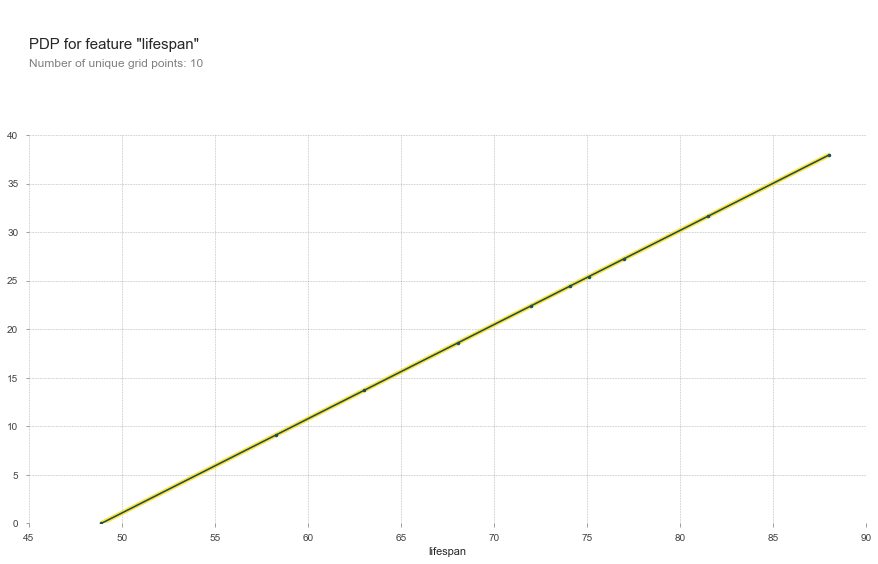

In [226]:
feature = 'lifespan'

isolated = pdp_isolate(
    model=lr3, 
    dataset=X_val, 
    model_features=X_val.columns,
    feature=feature,
    
)
pdp_plot(isolated, feature_name=feature, plot_lines=True, frac_to_plot=50);
plt.xlim(45,90);
plt.ylim(0,40);

## Final Test Validation

In [227]:
y_pred = lr3.predict(X_test_transformed)

# MAE, RMSE & R2: 
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
print(f'Mean Absolut Error(predict lifespan for years 2011 & 2012): {mae:.4f}')
print('Validation Root_Mean_Square_error:', rmse)
print('Validation R\u00b2:', r2)

Mean Absolut Error(predict lifespan for years 2011 & 2012): 0.6953
Validation Root_Mean_Square_error: 1.739553006701869
Validation R²: 0.9563103483156468


In [228]:
# series of true and predicted values
y_true = pd.Series(y_test, index=test.index)
y_prediction= pd.Series(y_pred, index=test.index)

In [229]:
# df with test data, y true values and y predict values
data = {'country': test['country'],'development':test['development'], 'year': test['year'], 'y_true':y_true, 'y_pred':y_prediction, 'previous_year_lifespan':test['lifespan'] } 
  
# Creating prediction DataFrame 
results = pd.DataFrame(data) 
  
# Printing the output 
results 

,country,development,year,y_true,y_pred,previous_year_lifespan
1,Afghanistan,Developing,2014,65.0,60.507399,59.9
2,Afghanistan,Developing,2013,59.9,60.507399,59.9
17,Albania,Developing,2014,77.8,77.580269,77.5
18,Albania,Developing,2013,77.5,77.289254,77.2
33,Algeria,Developing,2014,75.6,75.543165,75.4
...,...,...,...,...,...,...
2892,Yemen,Developing,2013,65.4,65.842671,65.4
2907,Zambia,Developing,2014,61.8,61.671458,61.1
2908,Zambia,Developing,2013,61.1,63.514552,63.0
2923,Zimbabwe,Developing,2014,67.0,59.828365,59.2


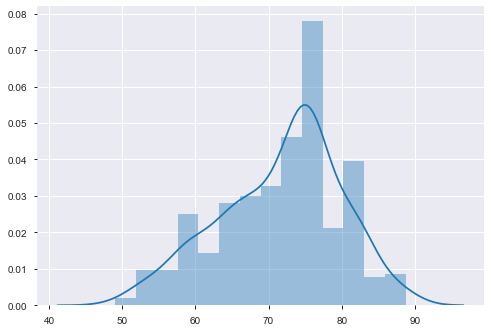

In [120]:
# checking distribution of predicted values
sns.distplot(y_pred);

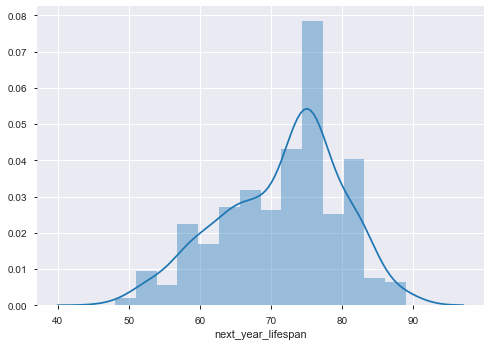

In [121]:
# checking distribution of true values
sns.distplot(y_true);

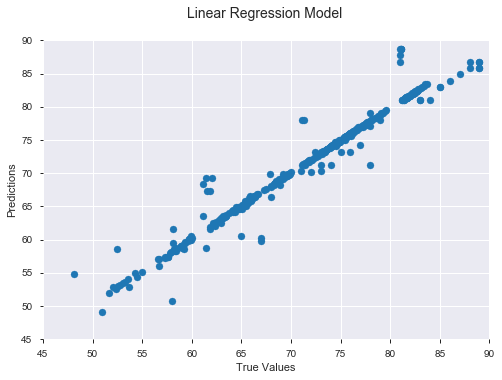

In [230]:
# plot of true and predicted values
plt.title('Linear Regression Model \n', size = 14)
plt.scatter(y_true, y_pred)
# plt.plot(y_true, y_pred, color="red")
plt.xlim(45,90)
plt.ylim(45,90)
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.show()

In [231]:
# y = m*x + b (Cartesian plotting formula)
m = lr3.coef_[0]
b = lr3.intercept_
print('y = mx + b')
print(f'y = {m:.2f}*x + {b:.2f}')
print(f'following year life expectancy = {m:.2f}*current year life expectancy + {b:.2f}')

y = mx + b
y = 0.97*x + 2.40
following year life expectancy = 0.97*current year life expectancy + 2.40


In [232]:
# predicting lifespan:
def predict(lifespan):
    y_pred = lr3.predict([[lifespan]])
    estimate = y_pred[0]
    coefficient = lr3.coef_[0]
    result = f'{estimate:,.0f} is the estimated life expectancy on the following year as {lifespan:,.0f} years life expectancy in the current year. '
    explanation = f'In this linear regression, each additional year on current life expectancy adds {coefficient:,.2f} years to the next year life expectancy.'
    return result + explanation

In [233]:
predict(110)

'109 is the estimated life expectancy on the following year as 110 years life expectancy in the current year. In this linear regression, each additional year on current life expectancy adds 0.97 years to the next year life expectancy.'

In [234]:
# intialising data of lists. 
data = {'Model Name':['LinReg-22 features', 'Ridge-22 features', 'DecisionTreeReg-22 features',
                      'RandomForestReg -22 features', 'XGBoostReg- 22 features', 'XGBoostTuned- 22 features',
                      'LinReg-4 features', 'Ridge-4 features', 'DecisionTreeReg-4 features',
                      'RandomForestReg -4 features','XGBoostReg- 4 features', 'XGBoostTuned- 4 features',
                      'LinReg-1 feature','Ridge-1 feature','DecisionTreeReg-1 feature', 
                      'RandomForestReg -1 feature','XGBoostReg-1 feature', 'XGBoostTuned-1 feature'],
        'MAE':[val_mae_lr, val_mae_ri, val_mae_dtr, val_mae_rf, val_mae_xgb, val_mae_xgbtuned,
               val_mae_lr2, val_mae_ri2, val_mae_dtr2, val_mae_rf2,val_mae_xgb2, val_mae_xgbtuned2,
               val_mae_lr3, val_mae_ri3, val_mae_dtr3, val_mae_rf3,val_mae_xgb3, val_mae_xgbtuned3], 
        'RMSE':[val_rmse_lr, val_rmse_ri, val_rmse_dtr, val_rmse_rf,val_rmse_xgb, val_rmse_xgbtuned,
                val_rmse_lr2, val_rmse_ri2, val_rmse_dtr2, val_rmse_rf2,val_rmse_xgb2, val_rmse_xgbtuned2,
                val_rmse_lr3, val_rmse_ri3, val_rmse_dtr3, val_rmse_rf3,val_rmse_xgb3, val_rmse_xgbtuned3], 
        'R2_score':[val_r2_lr, val_r2_ri, val_r2_dtr, val_r2_rf,val_r2_xgb, val_r2_xgbtuned,
                val_r2_lr2, val_r2_ri2, val_r2_dtr2, val_r2_rf2,val_r2_xgb2, val_r2_xgbtuned2,
                val_r2_lr3, val_r2_ri3, val_r2_dtr3, val_r2_rf3,val_r2_xgb3, val_r2_xgbtuned3]} 
  
# Create DataFrame 
df = pd.DataFrame(data) 
  
# Print the output. 
df 

,Model Name,MAE,RMSE,R2_score
0,LinReg-22 features,0.826355,1.681430,0.960559
1,Ridge-22 features,0.826387,1.681476,0.960557
2,DecisionTreeReg-22 features,1.261475,2.707372,0.897746
3,RandomForestReg -22 features,0.931467,1.846556,0.952433
4,XGBoostReg- 22 features,0.847239,1.516061,0.967936
5,XGBoostTuned- 22 features,0.951394,1.701714,0.959602
6,LinReg-4 features,0.746322,1.671421,0.961028
7,Ridge-4 features,0.745991,1.671492,0.961024
8,DecisionTreeReg-4 features,1.127596,2.439033,0.917011
9,RandomForestReg -4 features,0.820640,1.558328,0.966123


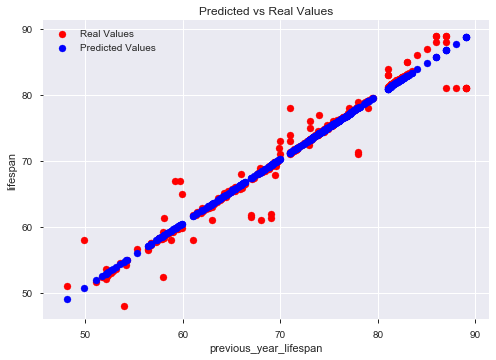

In [248]:
plt.scatter(results['previous_year_lifespan'].values,results['y_true'].values,color='red', label='Real Values')
plt.scatter(results['previous_year_lifespan'].values,results['y_pred'].values,color='blue', label='Predicted Values')
plt.legend()
plt.title('Predicted vs Real Values')
plt.xlabel('previous_year_lifespan')
plt.ylabel('lifespan')
plt.show()